# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

We're going to take the following approach:
1. Problem Definition
2. Data
3. Evaluation
4. Features
5. Modelling
6. Experimentation

## 1. Problem Definition

In a statement,
>Identifying the breed of a dog given an image of a dog.

## 2. Data

The data is downloaded  from the Kaggle Dog Breed Identification competition: https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

> For each image in the test set, we must predict a probability for each of the different breeds.

## 4. Features

* The dataset comprises 120 breeds of dogs.

* We're dealing with images (unstructured data).

* Deep learning and transfer learning can be used.


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
os.chdir('/content/drive/My Drive/Colab Notebooks/Project3/')
!pwd

/content/drive/My Drive/Colab Notebooks/Project3


In [3]:
#!unzip "/content/drive/My Drive/Colab Notebooks/Project3/dog-breed-identification.zip" -d "/content/drive/My Drive/Colab Notebooks/Project3/"

### Get our workspace ready

* Import Tensorflow 2.x
* Import Tensorflow Hub
* Make sure we're using a GPU

In [4]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: " + tf.__version__)
print("TF_hub version: " + hub.__version__)

if tf.config.list_physical_devices("GPU"):
  print("GPU available")
else:
  print("GPU not available")

TF version: 2.12.0
TF_hub version: 0.13.0
GPU available


## Getting our data ready (turning into tensors)

Checking out the labels.

In [5]:
import pandas as pd

labels_csv = pd.read_csv("labels.csv")
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [6]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

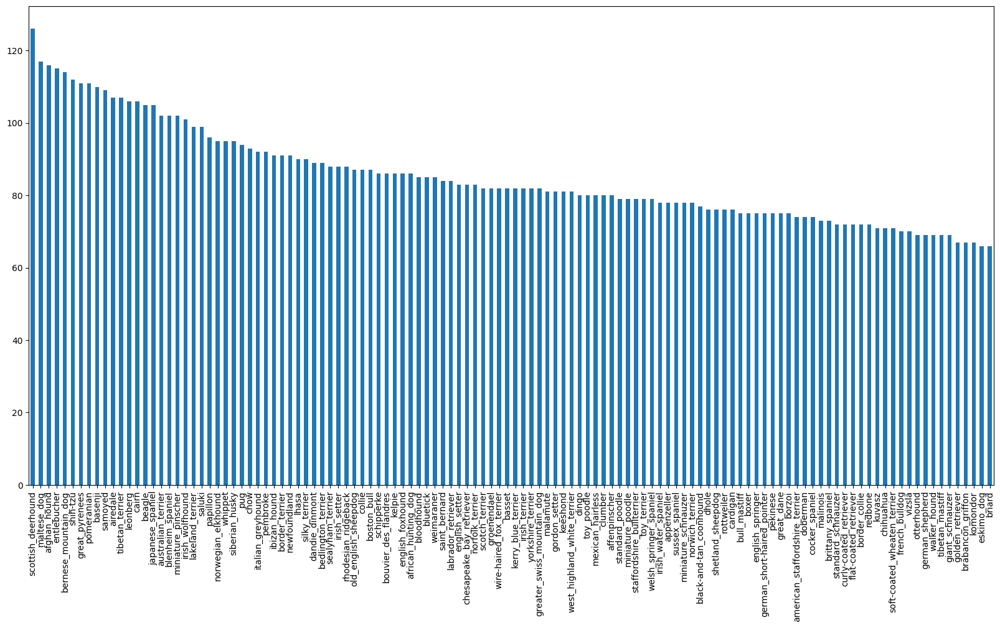

In [7]:
labels_csv["breed"].value_counts().plot.bar(figsize = (20,10))

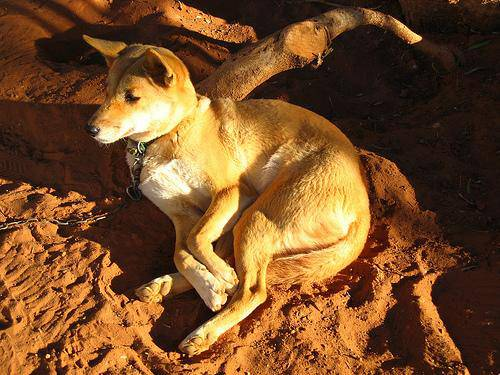

In [8]:
# Let's view an image
from IPython.display import Image
Image("train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## Getting images and their labels

In [9]:
filenames = [("train/" + fname + ".jpg") for fname in labels_csv["id"]]

In [10]:
filenames[:10]

['train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'train/001cdf01b096e06d78e9e5112d419397.jpg',
 'train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'train/002a283a315af96eaea0e28e7163b21b.jpg',
 'train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
import os
if len(os.listdir("train/")) == len(filenames):
  print("Filenames match actual amount of files.")
else:
  print("Filenames do not match actual amount of files.")

Filenames match actual amount of files.


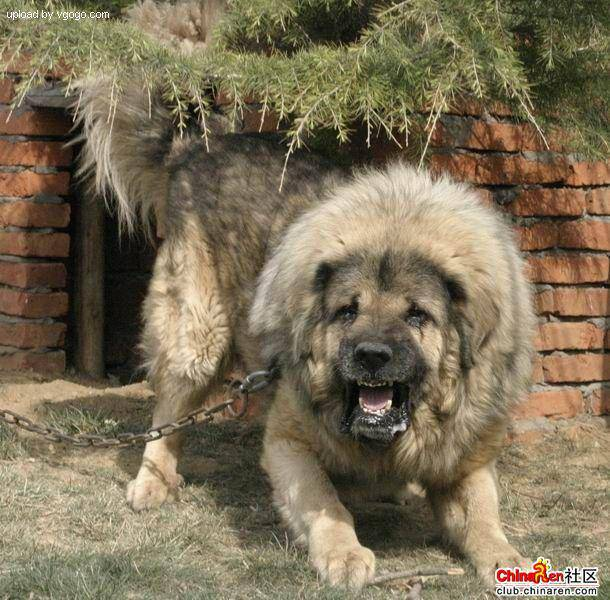

In [12]:
Image(filenames[9000])

Let's prepare our labels.

In [13]:
import numpy as np
labels = np.array(labels_csv["breed"])
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [14]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [15]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]

In [16]:
# Turning boolean array into integers


### Creating our own validation set

In [17]:
# Setup X & y variables
X = filenames
y = boolean_labels

Experimenting with 1000 images

In [18]:
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max: 10000, step: 1000}

In [19]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size = 0.2, random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

## Preprocessing Images (turning images into Tensors)

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, "image"
3. Turn our "image" into Tensors
4. Resize the "image" to be a shape of (224, 224)
5. Return the modified "image"

In [20]:
# Define image size

IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels = 3)
  # Normalization
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size = [IMG_SIZE,IMG_SIZE])
  return image

## Turning our data into batches (limited memory)

In [21]:
# Create a simple function to return a tuple (image, label)

def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [22]:
(get_image_label(X_train[42], tf.constant(y_train[42])))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.2744866 , 0.20389837, 0.11079565],
         [0.2783996 , 0.19976756, 0.10625179],
         [0.30656803, 0.22681487, 0.13666254],
         ...,
         [0.12188374, 0.12972689, 0.17678571],
         [0.11385673, 0.13132882, 0.1738708 ],
         [0.10720414, 0.13465512, 0.1738708 ]],
 
        [[0.31015828, 0.2395263 , 0.1564482 ],
         [0.29944888, 0.2288911 , 0.14397548],
         [0.35615736, 0.28561288, 0.20727609],
         ...,
         [0.12188374, 0.12972689, 0.17678571],
         [0.12156864, 0.13725491, 0.18039216],
         [0.12156864, 0.13725491, 0.18039216]],
 
        [[0.31448126, 0.24534611, 0.18136677],
         [0.32765028, 0.26288837, 0.19786212],
         [0.28300735, 0.21902803, 0.15713201],
         ...,
         [0.12188374, 0.12972689, 0.17678571],
         [0.11619399, 0.13188025, 0.1750175 ],
         [0.11619399, 0.13188025, 0.1750175 ]],
 
        ...,
 
        [[0.84118253, 0.7941237 

Turn all of our data into batches.

In [23]:
# Define the batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data: # We don't need to shuffle
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data = data.shuffle(buffer_size = len(X))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch


In [24]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches...
Creating validation data batches...


In [25]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is in the form of batches.

In [26]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  plt.figure(figsize = (10, 10))
  for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [27]:
train_images, train_labels = next(train_data.as_numpy_iterator())

In [28]:
train_images.shape

(32, 224, 224, 3)

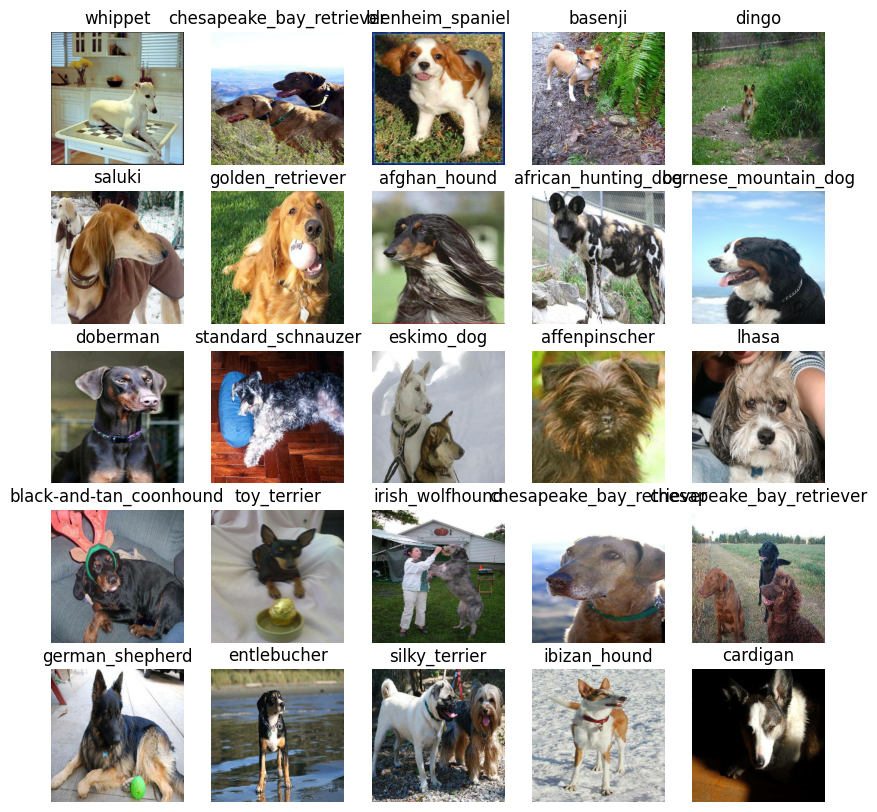

In [29]:
show_25_images(train_images, train_labels)

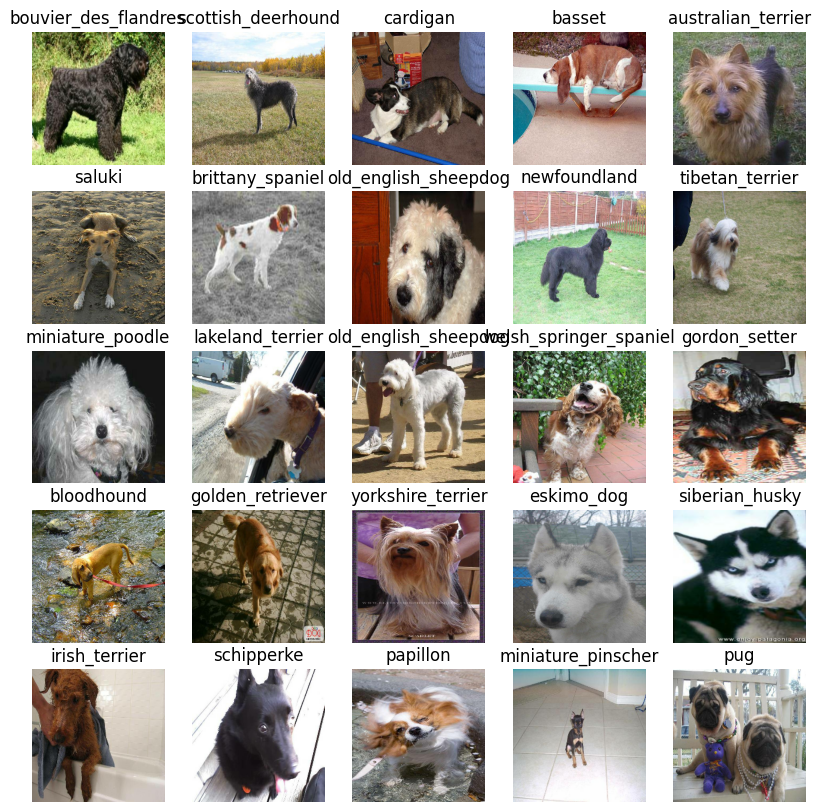

In [30]:
val_images, val_labels = next(train_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

We need to define:
* The input shape.
* The output shape.
* The URL of the model we want to use.


In [31]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

## Keras deep learning model

In [32]:
from tensorflow import keras
from tensorflow.keras import layers

In [33]:
# Build a Keras model using Sequential fashion
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  # Setup the model layers
  model = keras.Sequential(
    [
        hub.KerasLayer(MODEL_URL),
        layers.Dense(OUTPUT_SHAPE, activation="softmax")
    ]
  )
  # Compile the model
  model.compile(optimizer=tf.keras.optimizers.Adam(),
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics= ["accuracy"])
  # Build the model
  model.build(INPUT_SHAPE)
  return model

In [34]:
model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### TensorBoard Callback

To setup a TensorBoard callback:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our "fit()" function.
3. Visualize our models training logs with the "%tensorboard" magic function.

In [35]:
# Creating callbacks
%load_ext tensorboard

In [70]:
import datetime

def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("./logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Calback

Early stopping helps stop our model from overfitting.

In [38]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_accuracy",
    patience=3,
)

## Training a Model

In [39]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max: 100, step: 10}

In [40]:
if tf.config.list_physical_devices("GPU"):
  print("GPU available")
else:
  print("GPU not available")

GPU available


In [41]:
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model = create_model()
  # Create new TensorBoard session everytime we train a model
  tensorboard_callback = create_tensorboard_callback()
  # Fit the model
  model.fit(
    x=train_data,
    validation_data=val_data,
    epochs=NUM_EPOCHS,
    callbacks=[tensorboard_callback, early_stopping],
    validation_freq=1
  )
  # Return the fitted model
  return model

In [42]:
model = train_model()

Epoch 1/100
25/25 [==============================] - 126s 4s/step - loss: 4.6468 - accuracy: 0.0812 - val_loss: 3.5890 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 3s 112ms/step - loss: 1.6661 - accuracy: 0.6750 - val_loss: 2.2565 - val_accuracy: 0.4750
Epoch 3/100
25/25 [==============================] - 4s 164ms/step - loss: 0.5755 - accuracy: 0.9425 - val_loss: 1.7779 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 3s 124ms/step - loss: 0.2605 - accuracy: 0.9862 - val_loss: 1.5695 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 3s 115ms/step - loss: 0.1506 - accuracy: 0.9962 - val_loss: 1.4938 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 3s 117ms/step - loss: 0.1008 - accuracy: 1.0000 - val_loss: 1.4444 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================] - 4s 163ms/step - loss: 0.0753 - accuracy: 1.0000 - val_loss: 1.4101 - val_accuracy: 0.6500


### Checking the Tensorboard logs

In [43]:
%tensorboard --logdir /logs

Output hidden; open in https://colab.research.google.com to view.

## Evaluate the Model

In [44]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [45]:
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 1s 92ms/step


array([[1.5229500e-03, 1.7649261e-04, 1.8709173e-03, ..., 7.3800713e-04,
        2.0490221e-05, 1.1009059e-03],
       [1.4220375e-03, 6.7419250e-04, 3.9918005e-02, ..., 1.5788412e-04,
        3.0075524e-03, 4.7689628e-05],
       [5.5469418e-06, 1.8932117e-04, 2.8619051e-04, ..., 1.5397985e-04,
        3.2078617e-05, 1.3808701e-03],
       ...,
       [3.1138461e-06, 2.1542217e-04, 5.1852496e-04, ..., 1.2130656e-04,
        7.8970101e-04, 8.5834489e-04],
       [4.3925368e-03, 1.3223471e-04, 8.8591361e-05, ..., 9.2590584e-05,
        1.0342199e-04, 4.1313069e-03],
       [2.9513234e-04, 1.2366218e-04, 3.3583370e-04, ..., 2.7692900e-03,
        2.2926189e-04, 7.2977949e-05]], dtype=float32)

In [46]:
predictions.shape

(200, 120)

In [47]:
# First prediction
index = 0
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[predictions[index].argmax()]}")

Max value (probability of prediction): 0.20036421716213226
Sum: 1.0
Max index: 17
Predicted label: border_terrier


In [48]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[prediction_probabilities.argmax()]

pred_label = get_pred_label(predictions[0])
pred_label

'border_terrier'

In [49]:
# Unbatchify
def unbatchify(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[label.argmax()])
  return images, labels

In [50]:
val_images, val_labels = unbatchify(val_data)

In [51]:
def plot_pred(prediction_probabilities, labels, images, n):
  pred_prob = np.max(prediction_probabilities[n])
  true_label = labels[n]
  image = images[n]
  pred_label = unique_breeds[prediction_probabilities[n].argmax()]
  plt.imshow(image)
  if pred_label == true_label:
    back_color = "green"
  else:
    back_color = "red"
  plt.title(f"Prediction: {pred_label} --> prob: {pred_prob:.2f}% \nTrue label: {true_label}", color = back_color)
  plt.xticks([])
  plt.yticks([])

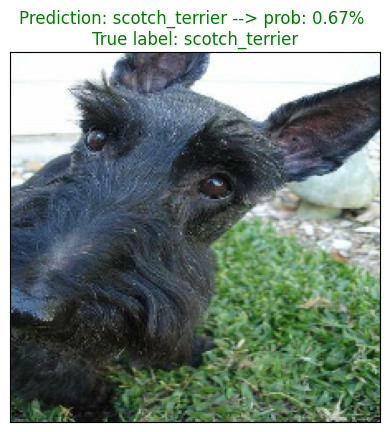

In [52]:
plot_pred(predictions, val_labels, val_images, 1)

In [53]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  # Get the predicted label
  pred_label = get_pred_label(pred_prob)
  # Find the top 10 prediction confidence indexes
  top_10_pred_index = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_index]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_index]
  # Setup plot
  color_list = np.full((10,), "grey")
  if np.isin(true_label, top_10_pred_labels):
    color_list[np.argmax(top_10_pred_labels == true_label)] = "red"
  else:
    pass
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color = color_list)
  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation = "vertical")
  plt.show()

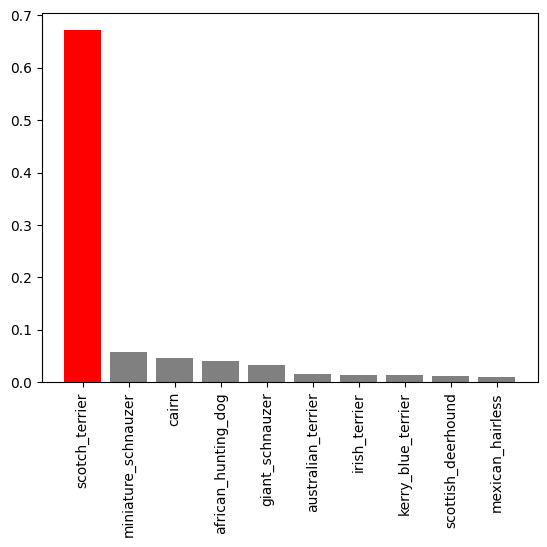

In [54]:
plot_pred_conf(predictions, val_labels, n = 1)

## Saving and reloading a trained model

In [65]:
def save_model(model, suffix = None):
  # Create a model directory pathname with current name
  if not os.path.exists('./models'):
    print('open directory...', flush=True)
    os.makedirs('./models')
  modeldir = os.path.join("./models", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to {model_path}...")
  model.save(model_path)
  return model_path

In [60]:
def load_model(model_path):
  print(f"Loads a saved model from {model_path}...")
  model = tf.keras.models.load_model(model_path, custom_objects = {"KerasLayer": hub.KerasLayer})
  return model

In [66]:
# Save our model trained on 1000 images (suffix)
save_model(model, suffix = "1000-images-mobilenetv2-Adam")

open directory...
Saving model to ./models/20230411-175925-1000-images-mobilenetv2-Adam.h5...


'./models/20230411-175925-1000-images-mobilenetv2-Adam.h5'

In [68]:
# Load a trained model
loaded_1000_image_model = load_model('./models/20230411-175925-1000-images-mobilenetv2-Adam.h5')

Loads a saved model from ./models/20230411-175925-1000-images-mobilenetv2-Adam.h5...


In [69]:
# Evaluate the pre-saved model
model.evaluate(val_data)
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 122ms/step - loss: 1.3727 - accuracy: 0.6500


[1.372725486755371, 0.6499999761581421]

## Training a model on the full data

Create a data batch

In [71]:
full_data = create_data_batches(X, y)

Creating training data batches...


Create a model

In [72]:
full_model = create_model()

Create full model callbacks

In [73]:
full_model_tensorboard = create_tensorboard_callback()

In [74]:
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="accuracy",
    patience=3,
)

Fit the full model to the full data

In [75]:
full_model.fit(
    x=full_data,
    epochs=NUM_EPOCHS,
    callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 38s 104ms/step - loss: 1.3196 - accuracy: 0.6725
Epoch 2/100
320/320 [==============================] - 32s 101ms/step - loss: 0.4005 - accuracy: 0.8829
Epoch 3/100
320/320 [==============================] - 32s 101ms/step - loss: 0.2373 - accuracy: 0.9352
Epoch 4/100
320/320 [==============================] - 32s 101ms/step - loss: 0.1527 - accuracy: 0.9650
Epoch 5/100
320/320 [==============================] - 36s 111ms/step - loss: 0.1056 - accuracy: 0.9788
Epoch 6/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0770 - accuracy: 0.9868
Epoch 7/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0578 - accuracy: 0.9923
Epoch 8/100
320/320 [==============================] - 33s 101ms/step - loss: 0.0461 - accuracy: 0.9932
Epoch 9/100
320/320 [==============================] - 32s 100ms/step - loss: 0.0389 - accuracy: 0.9950
Epoch 10/100
320/320 [==============================] - 32s 101m

In [77]:
save_model(full_model, suffix = "full-image-set-mobilenetv2-Adam")

Saving model to ./models/20230411-184626-full-image-set-mobilenetv2-Adam.h5...


'./models/20230411-184626-full-image-set-mobilenetv2-Adam.h5'

In [78]:
loaded_full_model = load_model('./models/20230411-184626-full-image-set-mobilenetv2-Adam.h5')

Loads a saved model from ./models/20230411-184626-full-image-set-mobilenetv2-Adam.h5...
